# Outlier Detection of JMA Tokyo 2020-10 week 1 data

This notebook demonstrates outlier detection using the minimal unit clustering algorithm on a annealing machine.

## QUBO formulation

Vadim N. Smelyanskiy, Eleanor G. Rieffel, Sergey I. Knysh, Colin P. Williams, Mark W. Johnson, Murray C. Thom, William G. Macready, and Kristen L. Pudenz, "A near-term quantum computing approach for hard computational problems in space exploration," arXiv preprint arXiv:1204.2821, 2012.
https://arxiv.org/abs/1204.2821

Section IX. Anomaly Detection for space systems

## Problem Definition

The minimal unit clustering:

### Given

- A set of points $P$
- A set of $S$ of boxes (disks) covering these points

### Objective

- Find the minimal subset $S_{min}$ of $S$ that covers $P$.

## Step 1: Data Preparation

https://gist.github.com/kotarot/a7f9cefac9a7fa50529ee017ea3cfa5f

In [1]:
import pandas as pd
import numpy as np

import IPython.display
import matplotlib.patches as patches
from matplotlib import pylab as plt
%matplotlib inline
from PIL import Image

# Default font size is 12
plt.rcParams['font.size'] = 16

import glob
import os
import time
import warnings
warnings.simplefilter('ignore')
from tqdm.notebook import tqdm

import sawatabi

In [2]:
url = "https://gist.githubusercontent.com/kotarot/a7f9cefac9a7fa50529ee017ea3cfa5f/raw/b32b903b933cde33312caa81a787702e6868d6fb/JMA_Tokyo_202010w1_withoutliers.csv"
df = pd.read_csv(url, index_col=0)

# If we want to limit the data size. 144 means a day (6 * 24 = 144).
#df = df[0:144]

df

,datetime,Pressure,Precipitation,Temperature,Relative Humidity,Sunlight Hours,Day/Night,outlier
0,2020-10-01 00:10:00,1006.500000,NaN,19.600000,82,NaN,Night,False
1,2020-10-01 00:20:00,1006.600000,NaN,19.500000,82,NaN,Night,False
2,2020-10-01 00:30:00,1006.700000,NaN,19.600000,81,NaN,Night,False
3,2020-10-01 00:40:00,1006.900000,NaN,19.600000,82,NaN,Night,False
4,2020-10-01 00:50:00,1006.900000,NaN,19.700000,82,NaN,Night,False
...,...,...,...,...,...,...,...,...
1003,2020-10-07 23:20:00,1014.508127,0.5,18.802471,97,NaN,Night,True
1004,2020-10-07 23:30:00,1023.100000,0.5,15.000000,97,NaN,Night,False
1005,2020-10-07 23:40:00,1022.900000,0.0,15.000000,97,NaN,Night,False
1006,2020-10-07 23:50:00,1022.800000,0.0,14.700000,97,NaN,Night,False


First, we'd like to look into the original data.

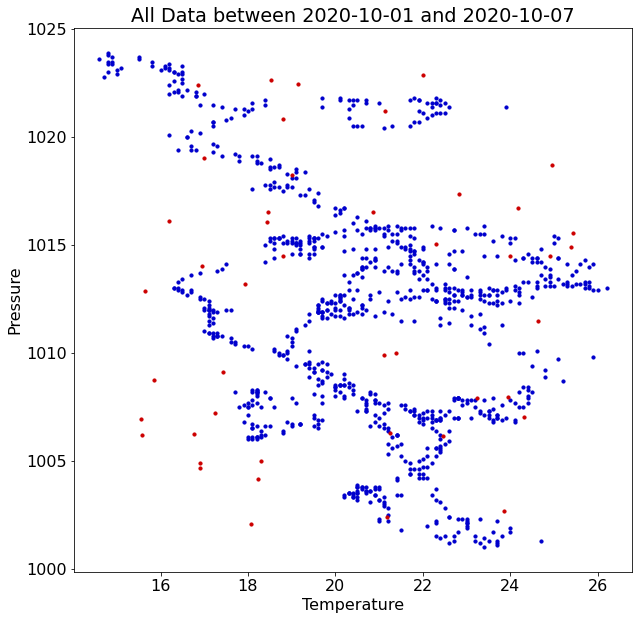

In [3]:
x_good = df.query("outlier == False")["Temperature"]
y_good = df.query("outlier == False")["Pressure"]
x_bad = df.query("outlier == True")["Temperature"]
y_bad = df.query("outlier == True")["Pressure"]

def plot_data(x_good, y_good, x_bad, y_bad, title):
    fig = plt.figure(figsize=(10, 10))
    ax = plt.axes()
    plt.title(title)
    plt.scatter(x_good, y_good, c="#00c", s=10)
    plt.scatter(x_bad, y_bad, c="#c00", s=10)
    plt.xlabel("Temperature")
    plt.ylabel("Pressure")
    plt.show()

plot_data(x_good, y_good, x_bad, y_bad, "All Data between 2020-10-01 and 2020-10-07")

Normalize the data.

In [4]:
df_norm = df.loc[:, ["Pressure", "Temperature"]]

# Min-max normalization
df_norm = (df_norm - df_norm.min()) / (df_norm.max() - df_norm.min())

# z-score normalization
#df_norm = (df_norm - df_norm.mean()) / df_norm.std()

df_norm = df_norm.rename(columns={"Pressure": "Pressure (norm)", "Temperature": "Temperature (norm)"})
df_norm

,Pressure (norm),Temperature (norm)
0,0.240175,0.431034
1,0.244541,0.422414
2,0.248908,0.431034
3,0.257642,0.431034
4,0.257642,0.439655
...,...,...
1003,0.589875,0.362282
1004,0.965066,0.034483
1005,0.956332,0.034483
1006,0.951965,0.008621


In [5]:
df = df.join(df_norm)

# Drop unnecessary columns
df = df.drop(columns=["Precipitation", "Relative Humidity", "Sunlight Hours", "Day/Night"])

df

,datetime,Pressure,Temperature,outlier,Pressure (norm),Temperature (norm)
0,2020-10-01 00:10:00,1006.500000,19.600000,False,0.240175,0.431034
1,2020-10-01 00:20:00,1006.600000,19.500000,False,0.244541,0.422414
2,2020-10-01 00:30:00,1006.700000,19.600000,False,0.248908,0.431034
3,2020-10-01 00:40:00,1006.900000,19.600000,False,0.257642,0.431034
4,2020-10-01 00:50:00,1006.900000,19.700000,False,0.257642,0.439655
...,...,...,...,...,...,...
1003,2020-10-07 23:20:00,1014.508127,18.802471,True,0.589875,0.362282
1004,2020-10-07 23:30:00,1023.100000,15.000000,False,0.965066,0.034483
1005,2020-10-07 23:40:00,1022.900000,15.000000,False,0.956332,0.034483
1006,2020-10-07 23:50:00,1022.800000,14.700000,False,0.951965,0.008621


#normal data: 963
#outliers: 45
% of outliers: 4.46


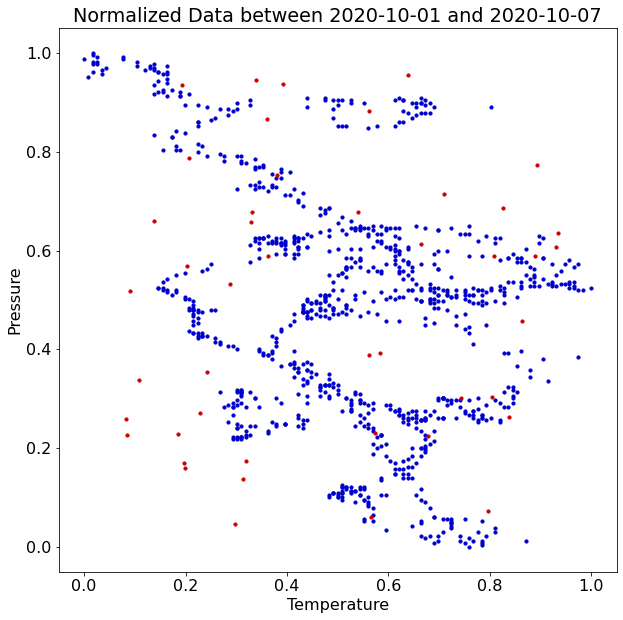

In [6]:
x_good = df.query("outlier == False")["Temperature (norm)"]
y_good = df.query("outlier == False")["Pressure (norm)"]
x_bad = df.query("outlier == True")["Temperature (norm)"]
y_bad = df.query("outlier == True")["Pressure (norm)"]

print(f"#normal data: {len(x_good)}")
print(f"#outliers: {len(x_bad)}")
print(f"% of outliers: {float(100 * len(x_bad) / (len(x_good) + len(x_bad))):.2f}")

plot_data(x_good, y_good, x_bad, y_bad, "Normalized Data between 2020-10-01 and 2020-10-07")

## Step 2: Annealing

### Parameters

In [7]:
# Parameters
PARAMS = {
    # Parameter for "Constraint: To prevent box overlaps". If the value is larger, overlaps of boxes would be reduced.
    "alpha": 1.0,

    # Parameter for "Constraint: All points should be included at least one box". If the value is larger, points outside boxes would be reduces.
    # If this value is 1.0, an isolated outlier can be easily chosen as a box center. The value slightly below 1.0 is good.
    "beta": 0.99,

    # Parameter for "Objective: Minimize the number of boxes".
    "gamma": 1.0,

    # Radius of a box
    "epsilon": 0.03,
}

WINDOW_SIZE = 72
BATCH_SIZE = 1

solver = sawatabi.solver.OptiganSolver()

### Helper functions

In [8]:
def is_neighbor(x, y, new_x, new_y):
    dist = abs(x - new_x) + abs(y - new_y)
    return dist <= PARAMS["epsilon"]

# Update neighborhood group (B_i)
def update_neighborhood(neighborhood, x, y, new_x, new_y):
    n = len(neighborhood)
    new_set = set([n])
    for index in neighborhood:
        if is_neighbor(x[index], y[index], new_x, new_y):
            neighborhood[index].add(n)
            new_set.add(index)
    neighborhood[n] = new_set
    return neighborhood

# Remove items related to all numbers below 'lower'
def reduce_neighborhood(neighborhood, lower):
    if lower == 0:
        return neighborhood
    for n in range(0, lower):
        neighborhood[n] = set()
        for index, neighbor in neighborhood.items():
            if n in neighbor:
                neighborhood[index].remove(n)
    return neighborhood

In [9]:
# Plot the results as a figure
def plot_results_with_solution(df, solution=None, show_only_centers=False, lower=0, n_batch=0, filename=None, show_fig=True, algorithm="ALL"):
    fig = plt.figure(figsize=(10, 10))
    ax = plt.axes()
    ax.set_aspect("equal")
    plt.xlim([-0.1, 1.1])
    plt.ylim([-0.1, 1.1])
    plt.xlabel("Temperature (normalized)")
    plt.ylabel("Pressure (normalized)")

    df_window = df[lower:n_batch]
    x_good = df_window.query("outlier == False")["Temperature (norm)"]
    y_good = df_window.query("outlier == False")["Pressure (norm)"]
    x_bad = df_window.query("outlier == True")["Temperature (norm)"]
    y_bad = df_window.query("outlier == True")["Pressure (norm)"]
    plt.scatter(x_good, y_good, c='#00c', s=10)
    plt.scatter(x_bad, y_bad, c='#c00', s=10)

    # Add boxes if the solution is given
    if solution is not None:
        for i, (key, s) in enumerate(solution.items()):
            if s == 1:
                r = patches.Rectangle(xy=(
                            df.iloc[lower + i]["Temperature (norm)"] - PARAMS["epsilon"],
                            df.iloc[lower + i]["Pressure (norm)"] - PARAMS["epsilon"]
                        ),
                        width=PARAMS["epsilon"] * 2, height=PARAMS["epsilon"] * 2,
                        ec="#c00", fc="#c00", alpha=0.2, fill=True)
                ax.add_patch(r)

    if solution is None:
        title = f"Batch {n_batch}"
    else:
        title = f"Solution (Algorithm: {algorithm})"
    plt.title(title)

    if show_fig:
        plt.show()

    # Save to a file to generate an animation later
    if filename is None:
        if solution is None:
            filename = f"figs/tmp_batch_{str(n_batch).zfill(4)}_only_data.png"
        else:
            filename = f"figs/tmp_batch_{str(n_batch).zfill(4)}_with_solution.png"
    fig.savefig(filename)

    plt.close()

In [10]:
def generate_animation(df, algorithm):

    # Concatenate (Arrange) data and solution figures horizontally
    def get_concat_h(im1, im2):
        dst = Image.new('RGB', (im1.width + im2.width, im1.height))
        dst.paste(im1, (0, 0))
        dst.paste(im2, (im1.width, 0))
        return dst

    def generate_animation_with_interval(start_index=1, interval=1, kind="full"):
        # Generate a Gif animation
        filename = "figs/tmp_empty.png"
        im = Image.open(filename)
        images = [im]
        for i in range(start_index, len(df) + 1, interval):
            filename = f"figs/tmp_batch_{str(i).zfill(4)}.png"
            im = Image.open(filename)
            images.append(im)

        # Show the last frame a little bit long time
        filename = f"figs/tmp_batch_{str(len(df)).zfill(4)}.png"
        im = Image.open(filename)
        for i in range(10):
            images.append(im)

        filename = f"figs/Outlier_Detection_JMA_Tokyo_202010_{algorithm}_{kind}.gif"
        images[0].save(filename, save_all=True, append_images=images[1:], loop=0, duration=100)
        return filename

    # Clean up tmp files
    def clean_up_tmp_files():
        for p in glob.glob("figs/tmp_*"):
            if os.path.isfile(p):
                os.remove(p)

    filename = "figs/tmp_empty_data.png"
    im1 = Image.open(filename)
    filename = "figs/tmp_empty_solution.png"
    im2 = Image.open(filename)
    get_concat_h(im1, im2).save("figs/tmp_empty.png")

    for n in range(1, len(df) + 1):
        filename = f"figs/tmp_batch_{str(n).zfill(4)}_only_data.png"
        im1 = Image.open(filename)
        filename = f"figs/tmp_batch_{str(n).zfill(4)}_with_solution.png"
        im2 = Image.open(filename)
        get_concat_h(im1, im2).save(f"figs/tmp_batch_{str(n).zfill(4)}.png")

    filename_full = generate_animation_with_interval(1, 1, "full")
    filename_thin = generate_animation_with_interval(10, 10, "thin")

    clean_up_tmp_files()

    return filename_full, filename_thin

In [11]:
# Calculate confusion matrix (TP, TN, FP, FN)
def calc_confusion_matrix(df, covered):
    # covered_list:
    # - True means: the point is covered by a box
    # - False means: the point is not covered by a box
    covered_list = list(covered.values())
    #print(covered_list)

    # label_list:
    # - True means: the point is NOT an outlier
    # - False means: the piont is an outlier
    label_list = np.invert(df.loc[:, ["outlier"]].values).flatten().tolist()
    #print(label_list)

    tp = tn = fp = fn = 0

    assert len(covered_list) == len(label_list)
    for predicted, actual in zip(covered_list, label_list):
        if (predicted == True) and (actual == True):
            tp += 1
        elif (predicted == False) and (actual == False):
            tn += 1
        elif (predicted == True) and (actual == False):
            fp += 1
        elif (predicted == False) and (actual == True):
            fn += 1

    confution_matrix = {
        "tp": tp, "tn": tn, "fp": fp, "fn": fn,
    }
    #print(confution_matrix)

    return confution_matrix

In [12]:
# Calculate TPR, TNR, FPR, FNR, and Accuracy
# Higher TXR is better, and lower FXR is better.
def calc_rate_and_accuracy(confusion_matrix):
    tp_fn = confusion_matrix['tp'] + confusion_matrix['fn']
    if 0 < tp_fn:
        tpr = confusion_matrix['tp'] / tp_fn
        fnr = confusion_matrix['fn'] / tp_fn
    else:
        tpr = fnr = np.nan

    tn_fp = confusion_matrix['tn'] + confusion_matrix['fp']
    if 0 < tn_fp:
        tnr = confusion_matrix['tn'] / tn_fp
        fpr = confusion_matrix['fp'] / tn_fp
    else:
        tnr = fpr = np.nan

    acc = (confusion_matrix['tp'] + confusion_matrix['fn']) / (tp_fn + tn_fp)

    rate_and_accuracy = {
        'tpr': tpr, 'tnr': tnr, 'fpr': fpr, 'fnr': fnr,
        'accuracy': acc,
    }
    #print(rate_and_accuracy)

    return rate_and_accuracy

In [13]:
def generate_time_chart(df):
    df.loc[:, ["Processing Time", "Solving Time"]].plot(figsize=(12, 4))

In [14]:
def generate_accuracy_chart(df):
    df.loc[:, ["TPR", "TNR", "Accuracy"]].plot(figsize=(12, 3), ylim=[-0.1, 1.1], cmap="Set1")

### Build model and solve!

#### Processing

In [15]:
def process(model, df, algorithm):
    _df = df.copy()

    # Generate empty figures for the first frame for an animation
    plot_results_with_solution(df=_df, solution=None, lower=0, n_batch=0, filename="figs/tmp_empty_data.png", show_fig=False, algorithm=algorithm)
    plot_results_with_solution(df=_df, solution={}, lower=0, n_batch=0, filename="figs/tmp_empty_solution.png", show_fig=False, algorithm=algorithm)

    _df["Processing Time"] = np.nan
    _df["Solving Time"] = np.nan
    #_df["solution"] = ""
    _df["TP"] = 0
    _df["TN"] = 0
    _df["FP"] = 0
    _df["FN"] = 0
    _df["TPR"] = np.nan
    _df["TNR"] = np.nan
    _df["FPR"] = np.nan
    _df["FNR"] = np.nan
    _df["Accuracy"] = np.nan
    _df["#centers"] = 0
    _df["centers"] = ""

    x = np.empty(0)
    y = np.empty(0)
    neighborhood = {}

    for index, row in tqdm(_df.iterrows(), total=len(_df)):
        processing_start_time = time.time()

        ################################
        # Pre prcessing:
        # Calculate neighbor group and build qubo

        window_upper = index
        if algorithm == "ALL":
            window_lower = 0
        elif algorithm == "WINDOW":
            window_lower = window_upper - WINDOW_SIZE + 1
            if window_lower < 0:
                window_lower = 0

        n_batch = index + 1
        #print("\n================")
        #print("Batch:", n_batch)
        #print("window_upper:", window_upper)
        #print("window_lower:", window_lower)
        #print(row)
        new_x = row["Temperature (norm)"]
        new_y = row["Pressure (norm)"]
        neighborhood = update_neighborhood(neighborhood, x, y, new_x, new_y)
        if algorithm == "WINDOW":
            neighborhood = reduce_neighborhood(neighborhood, window_lower)
        x = np.append(x, new_x)
        y = np.append(y, new_y)
        #print("neighborhood:", neighborhood)
        #print("x:", x)
        #print("y:", y)

        z = model.append("z", shape=(1,))

        # Constraint: To prevent box overlaps
        for i in range(0, window_upper):
            for j in range(i + 1, window_upper + 1):
                c = len(neighborhood[i] & neighborhood[j])
                if c > 0:
                    coeff = -1.0 * PARAMS["alpha"] * c
                    model.update_interaction((z[i], z[j]), coefficient=coeff)

        # Constraint: All points should be included at least one box
        for i in range(window_upper + 1):
            c = len(neighborhood[i])
            if c > 0:
                coeff = 1.0 * PARAMS["beta"] * c
                model.update_interaction(z[i], coefficient=coeff)

        # Objective: Minimize the number of boxes
        coeff = -1.0 * PARAMS["gamma"]
        model.add_interaction(z[window_upper], name=f"z[{window_upper}] for objective", coefficient=coeff)

        if window_lower > 0:
            model.delete_variable(z[window_lower - 1])

        ################################
        # Prcessing:
        # Annealing!

        physical = model.to_physical()
        #print(model)
        #print(physical)

        solving_start_time = time.time()
        sampleset = solver.solve(physical, timeout=100, duplicate=True)
        solution = sampleset.samples()[0]
        #print("solution:", solution)
        #_df.at[index, "solution"] = str(solution)
        solving_time = time.time() - solving_start_time

        ################################
        # Post processing:
        # Plot results and calculate confusion matrix

        # Calc centers and covered
        centers = set()
        covered = {i: False for i in range(window_lower, n_batch)}
        for i, (key, s) in enumerate(solution.items()):
            if s == 1:
                centers.add(window_lower + i)
                for n in neighborhood[window_lower + i]:
                    covered[n] = True
        _df.at[index, "centers"] = str(centers) if len(centers) > 0 else "{}"
        _df.at[index, "#centers"] = len(centers)
        #print(centers)
        #print(covered)
        confusion_matrix = calc_confusion_matrix(_df[window_lower:n_batch], covered)
        rate_and_accuracy = calc_rate_and_accuracy(confusion_matrix)

        _df.at[index, "TP"] = confusion_matrix["tp"]
        _df.at[index, "TN"] = confusion_matrix["tn"]
        _df.at[index, "FP"] = confusion_matrix["fp"]
        _df.at[index, "FN"] = confusion_matrix["fn"]
        _df.at[index, "TPR"] = rate_and_accuracy["tpr"]
        _df.at[index, "TNR"] = rate_and_accuracy["tnr"]
        _df.at[index, "FPR"] = rate_and_accuracy["fpr"]
        _df.at[index, "FNR"] = rate_and_accuracy["fnr"]
        _df.at[index, "Accuracy"] = rate_and_accuracy["accuracy"]

        processing_time = time.time() - processing_start_time

        plot_results_with_solution(df=_df, solution=None, lower=window_lower, n_batch=n_batch, show_fig=False, algorithm=algorithm)
        plot_results_with_solution(df=_df, solution=solution, lower=window_lower, n_batch=n_batch, show_fig=False, algorithm=algorithm)

        #print(f"[Batch: {n_batch}] processing_time: {processing_time:.3f} sec, solving_time: {solving_time:.3f} sec ({100 * solving_time / processing_time:.2f}%)")
        _df.at[index, "Processing Time"] = processing_time
        _df.at[index, "Solving Time"] = solving_time

    return _df

#### Algorithm: ALL

In [16]:
model = sawatabi.model.LogicalModel(mtype="qubo")
print(model)
model

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
┃ LOGICAL MODEL
┣━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
┣━ mtype: qubo
┣━ variables: []
┣━ interactions:
┃  linear:
┃    {}
┃  quadratic:
┃    {}
┣━ constraints:
┃    {}
┗━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━


LogicalModel({'mtype': 'qubo', 'variables': {}, 'interactions': {1: {}, 2: {}}, 'constraints': {}})

In [17]:
_df = process(model, df, "ALL")

In [18]:
filename_full, filename_thin = generate_animation(_df, "ALL")

In [19]:
# warn: large file
#IPython.display.Image(filename_full)

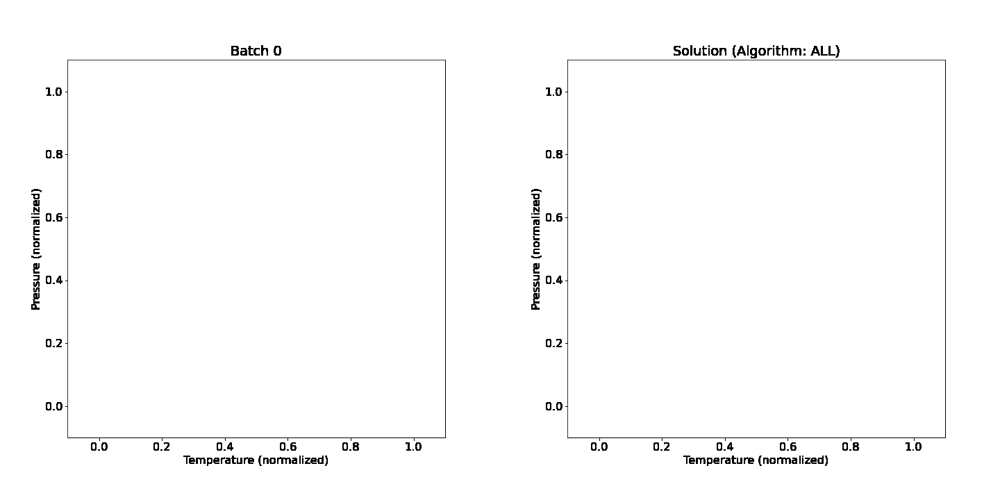

In [20]:
IPython.display.Image(filename_thin)

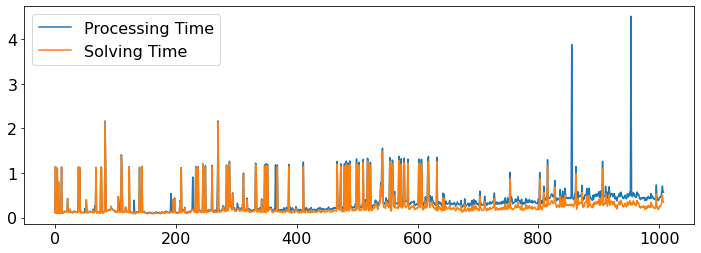

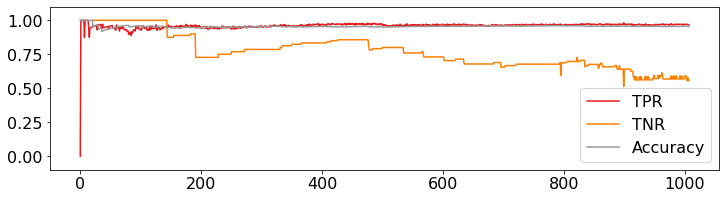

In [21]:
generate_time_chart(_df)
generate_accuracy_chart(_df)

In [22]:
# Look into solution and processing time
_df

,datetime,Pressure,Temperature,outlier,Pressure (norm),Temperature (norm),Processing Time,Solving Time,TP,TN,FP,FN,TPR,TNR,FPR,FNR,Accuracy,#centers,centers
0,2020-10-01 00:10:00,1006.500000,19.600000,False,0.240175,0.431034,0.117443,0.115259,0,0,0,1,0.000000,NaN,NaN,1.000000,1.000000,0,{}
1,2020-10-01 00:20:00,1006.600000,19.500000,False,0.244541,0.422414,1.145247,1.144282,2,0,0,0,1.000000,NaN,NaN,0.000000,1.000000,1,{0}
2,2020-10-01 00:30:00,1006.700000,19.600000,False,0.248908,0.431034,0.097862,0.096870,3,0,0,0,1.000000,NaN,NaN,0.000000,1.000000,1,{2}
3,2020-10-01 00:40:00,1006.900000,19.600000,False,0.257642,0.431034,0.101069,0.100027,4,0,0,0,1.000000,NaN,NaN,0.000000,1.000000,1,{3}
4,2020-10-01 00:50:00,1006.900000,19.700000,False,0.257642,0.439655,1.105536,1.104368,5,0,0,0,1.000000,NaN,NaN,0.000000,1.000000,1,{3}
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1003,2020-10-07 23:20:00,1014.508127,18.802471,True,0.589875,0.362282,0.503426,0.299054,930,26,19,29,0.969760,0.577778,0.422222,0.030240,0.955179,157,"{3, 519, 10, 522, 14, 18, 530, 21, 538, 28, 36..."
1004,2020-10-07 23:30:00,1023.100000,15.000000,False,0.965066,0.034483,0.577182,0.335893,931,25,20,29,0.969792,0.555556,0.444444,0.030208,0.955224,159,"{3, 516, 7, 521, 524, 13, 17, 531, 21, 536, 54..."
1005,2020-10-07 23:40:00,1022.900000,15.000000,False,0.956332,0.034483,0.707080,0.502995,933,26,19,28,0.970864,0.577778,0.422222,0.029136,0.955268,158,"{2, 516, 520, 9, 13, 529, 531, 24, 536, 26, 34..."
1006,2020-10-07 23:50:00,1022.800000,14.700000,False,0.951965,0.008621,0.568781,0.363549,931,25,20,31,0.967775,0.555556,0.444444,0.032225,0.955313,158,"{513, 3, 519, 10, 522, 14, 531, 21, 538, 27, 3..."


#### Algorithm: WINDOW

In [23]:
model = sawatabi.model.LogicalModel(mtype="qubo")
print(model)
model

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
┃ LOGICAL MODEL
┣━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
┣━ mtype: qubo
┣━ variables: []
┣━ interactions:
┃  linear:
┃    {}
┃  quadratic:
┃    {}
┣━ constraints:
┃    {}
┗━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━


LogicalModel({'mtype': 'qubo', 'variables': {}, 'interactions': {1: {}, 2: {}}, 'constraints': {}})

In [24]:
_df = process(model, df, "WINDOW")

In [25]:
filename_full, filename_thin = generate_animation(_df, "WINDOW")

In [26]:
# warn: large file
#IPython.display.Image(filename_full)

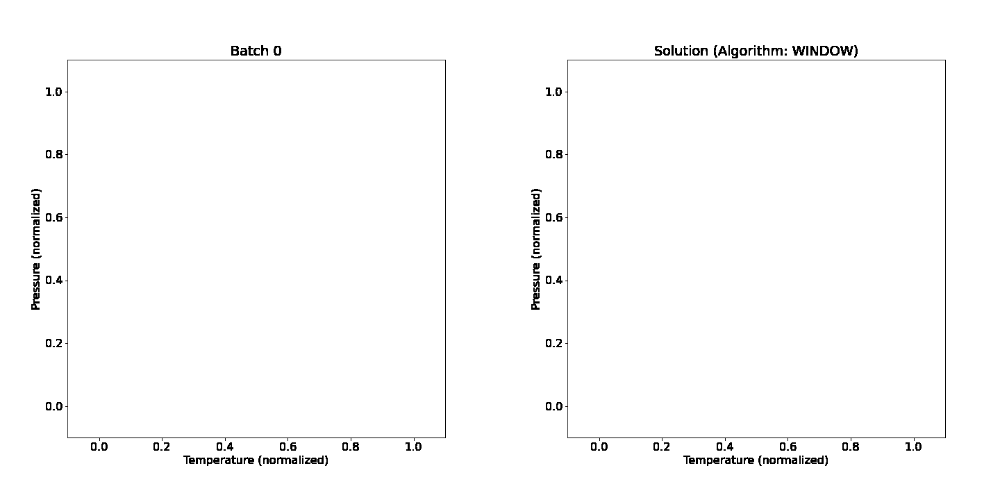

In [27]:
IPython.display.Image(filename_thin)

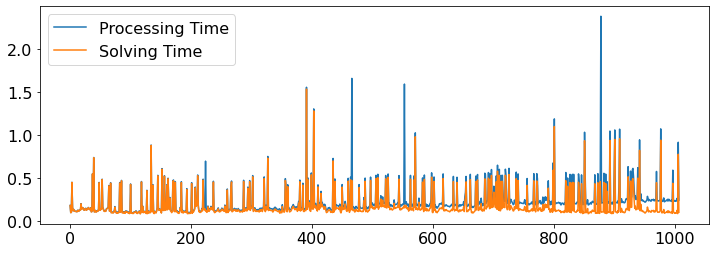

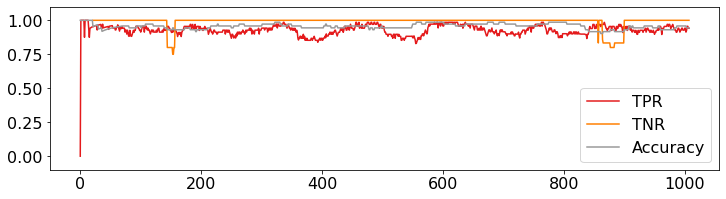

In [28]:
generate_time_chart(_df)
generate_accuracy_chart(_df)

In [29]:
# Look into solution and processing time
_df

,datetime,Pressure,Temperature,outlier,Pressure (norm),Temperature (norm),Processing Time,Solving Time,TP,TN,FP,FN,TPR,TNR,FPR,FNR,Accuracy,#centers,centers
0,2020-10-01 00:10:00,1006.500000,19.600000,False,0.240175,0.431034,0.186202,0.184156,0,0,0,1,0.000000,NaN,NaN,1.000000,1.000000,0,{}
1,2020-10-01 00:20:00,1006.600000,19.500000,False,0.244541,0.422414,0.102764,0.101701,2,0,0,0,1.000000,NaN,NaN,0.000000,1.000000,1,{1}
2,2020-10-01 00:30:00,1006.700000,19.600000,False,0.248908,0.431034,0.106178,0.105074,3,0,0,0,1.000000,NaN,NaN,0.000000,1.000000,1,{2}
3,2020-10-01 00:40:00,1006.900000,19.600000,False,0.257642,0.431034,0.455000,0.453943,4,0,0,0,1.000000,NaN,NaN,0.000000,1.000000,1,{0}
4,2020-10-01 00:50:00,1006.900000,19.700000,False,0.257642,0.439655,0.161406,0.159992,5,0,0,0,1.000000,NaN,NaN,0.000000,1.000000,1,{2}
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1003,2020-10-07 23:20:00,1014.508127,18.802471,True,0.589875,0.362282,0.240624,0.099963,63,4,0,5,0.926471,1.0,0.0,0.073529,0.944444,13,"{992, 963, 933, 965, 998, 970, 941, 943, 978, ..."
1004,2020-10-07 23:30:00,1023.100000,15.000000,False,0.965066,0.034483,0.268177,0.128607,65,4,0,3,0.955882,1.0,0.0,0.044118,0.944444,14,"{993, 963, 933, 965, 1000, 970, 1002, 941, 944..."
1005,2020-10-07 23:40:00,1022.900000,15.000000,False,0.956332,0.034483,0.231083,0.090958,65,4,0,3,0.955882,1.0,0.0,0.044118,0.944444,14,"{993, 963, 965, 1000, 937, 970, 941, 1005, 944..."
1006,2020-10-07 23:50:00,1022.800000,14.700000,False,0.951965,0.008621,0.920300,0.781218,64,4,0,4,0.941176,1.0,0.0,0.058824,0.944444,14,"{992, 963, 965, 998, 936, 970, 1005, 942, 944,..."
